# Seeing it in Action: Repetition


In this section, we will learn about source separation approaches that exploit a common feature of musical signals: repetition. In doing so, we will gain some understanding of the mechanics of source separation and how the an algorithm can assumptions about a signal to separate 

In this section, we will explore three algorithms that attempt to separate a repeating background from a non-repeating foreground. The basic assumption here is 1) that there is repetition in the mixture, and 2) the repetition captures what we want to separate. This assumption holds quite well if we want to separate a singer from a backing band, but might not work if we want to isolate a drum set from the rest of the band because the drum set is usually playing a repeating pattern. 

## REPET

The first algorithm we will explore here is called the REpeating Patern Extraction Technique or REPET {cite}`rafii2012repeating`. REPET works like this:

  1. Find a repeating period, $t_r$ seconds (_e.g._, the number of seconds which a chord progression might start over).
  2. Segment the spectrogram into $N$ segments, each with $t_r$ seconds in length.
  3. "Overlay" those $N$ segments.
  4. Take the median of those $N$ stacked segments and make a mask of the median values.

We'll use REPET to demonstrate how to run a source separation algorithm in `nussl`.

In [1]:
%%capture
!pip install git+https://github.com/source-separation/tutorial

In [3]:
# Do our imports
import nussl
import matplotlib.pyplot as plt
from common import viz

Let's download an audio file that has a lot of repetition in it, and inspect and listen to it:

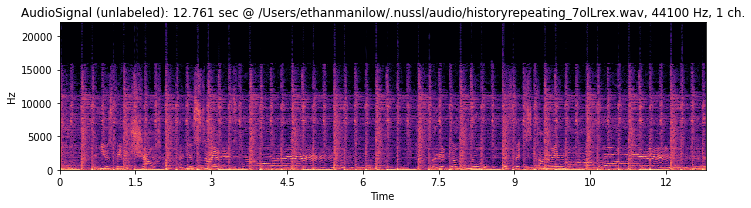

In [5]:
audio_path = nussl.efz_utils.download_audio_file('historyrepeating_7olLrex.wav', verbose=False)
history = nussl.AudioSignal(audio_path)
history.embed_audio()

plt.figure(figsize=(10, 3))
nussl.utils.visualize_spectrogram(history)
plt.title(str(history))
plt.tight_layout()
plt.show()

Now we need to instantiate a `Repet` object in `nussl`. We can do that like so:

In [6]:
repet = nussl.separation.primitive.Repet(history)

Now the `repet` object has our AudioSignal, it's easy to run the algorithm:

In [7]:
repet.run()

Oh, look! The `repet` object returned masks! We can get audio signals back by doing the following:

In [8]:
r_estimates = repet.make_audio_signals()

We can also chain both of those operations if we don't care about the intermediate steps:

In [9]:
r_estimates = repet()

Let's check out the masks that `repet` made:

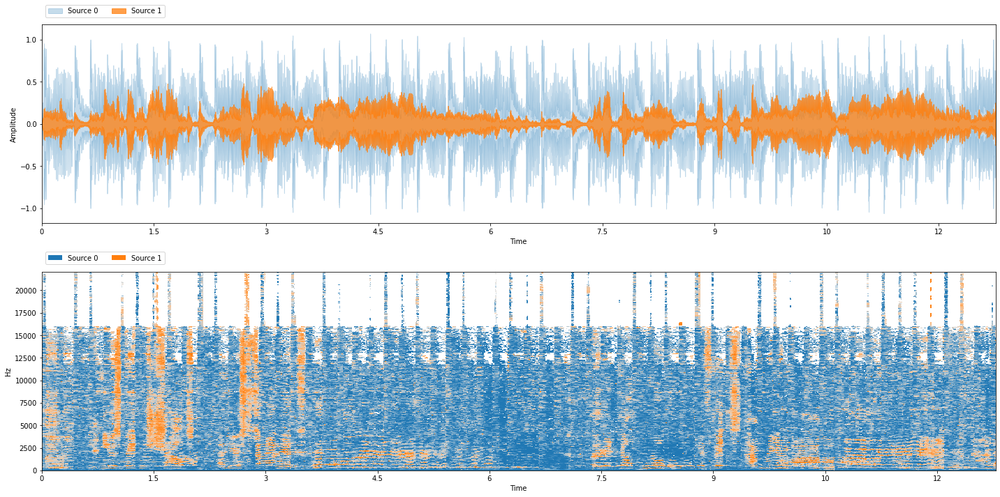


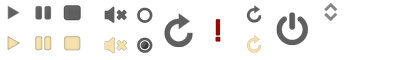
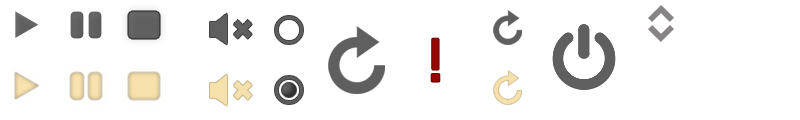
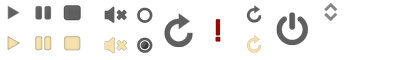

In [11]:
viz.show_sources(r_estimates)

And there are our foreground and background sources!


### Making it Interactive

`nussl` has hooks for [gradio](https://www.gradio.app/), so we can make our `repet` object interactive. All algorithms in `nussl` have this ability.

In [12]:
repet.interact()

AttributeError: 'Repet' object has no attribute 'interact'

Go ahead and play around with REPET. See what types of audio work and what types
of audio doesn't work. How does it work on electronic loops? How does it 
work on ambient music?


### Review

The process of running a separation algorithm in `nussl` was only a few steps:

  1. Instantiate a separation object with an audio signal. _E.g._, `repet = nussl.separation.primitive.Repet(history)`
  2. Run the object to get the results. _E.g._ `repet()`
  
Now let's look at a few other algorithms that leverage repetition in a musical recording and compare results to REPET.

## REPET-SIM

REPET-SIM is a variant of REPET that doesn't rely on a fixed repeating period. In fact, it doesn't rely on repetition as explicitly as REPET does. REPET-SIM calculates a similarity matrix between each pair of spectral frames in an STFT, selects the $k$ nearest nieghbors for each frame, and makes a mask by median filtering the bins for each of the selected neighbors. 

We can run REPET-SIM the same way we can run REPET:

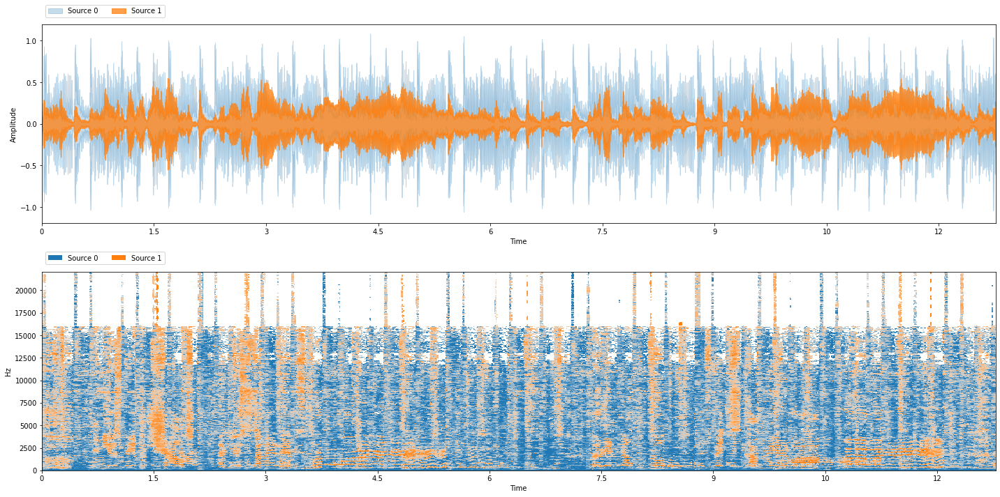


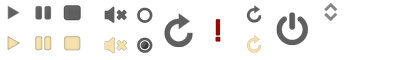
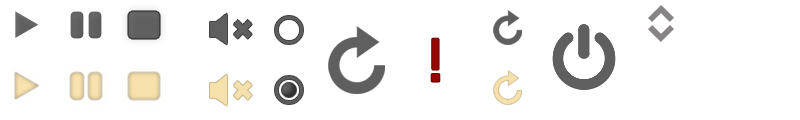
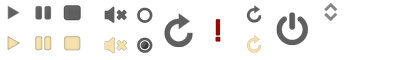

In [13]:
repet_sim = nussl.separation.primitive.RepetSim(history)
rs_estimates = repet_sim()

viz.show_sources(rs_estimates)

And let's make an interactive one as well:

In [15]:
repet_sim.interact()

AttributeError: 'RepetSim' object has no attribute 'interact'

## 2DFT

We can also use a Two-dimensional Fourier Transform (2DFT) of a spectrogram to find repeating and non-repeating patterns. Repeating sections show up as peaks in the 2DFT and non-repeating parts are everything else. We can use a peak picker to separate the repeating from non repeating parts. That's what this algorithm does:


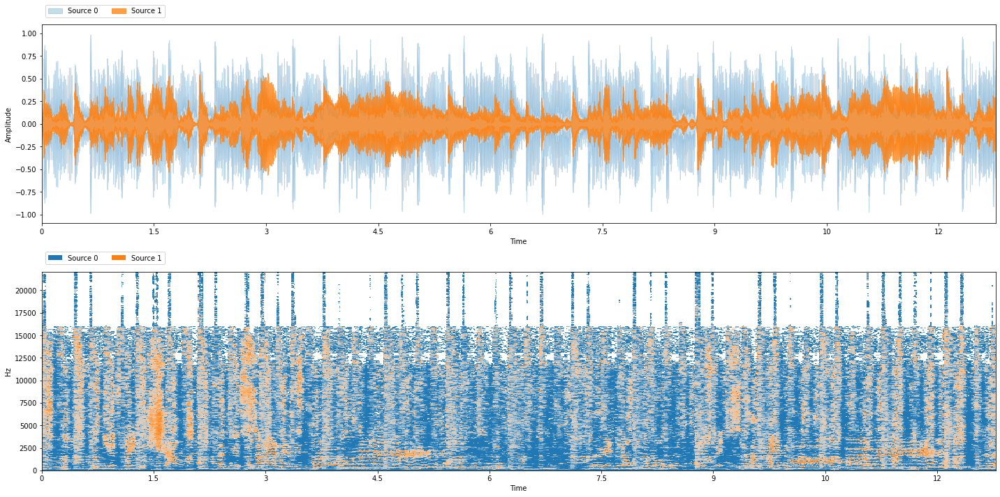


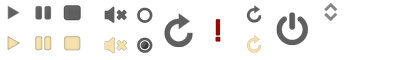
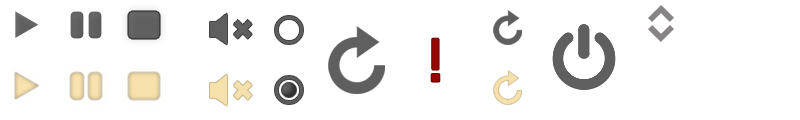
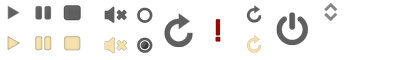

In [14]:
# We can't start a variable name with a number,
# so this object is called FT2D
ft2d = nussl.separation.primitive.FT2D(history)
ft2d_estimates = ft2d()
viz.show_sources(ft2d_estimates)

And let's make 2DFT interactive too:

In [16]:
ft2d.interact()

AttributeError: 'FT2D' object has no attribute 'interact'

## Next Steps...

There you have it. Three simple algorithms to separate repeating and non-repeating parts.

Next we'll talk about how we can build our own separation algorithms using `nussl`.